# EDA of California Housing Data

In [45]:
import pandas as pd
import plotly_express as px
from sklearn.datasets import fetch_california_housing
import datapane as dp

In [3]:
from math import cos, asin, sqrt

def distance(lat1, lon1, lat2, lon2):
    # adapted from https://stackoverflow.com/a/41337005/2886158
    p = 0.017453292519943295
    hav = 0.5 - cos((lat2-lat1)*p)/2 + cos(lat1*p)*cos(lat2*p) * (1-cos((lon2-lon1)*p)) / 2
    return 12742 * asin(sqrt(hav))

def closest(data, x_lat, x_lon):
    # adapted from https://stackoverflow.com/a/41337005/2886158
    return data.index(min(data, key=lambda p: distance(x_lat,x_lon,p['Latitude'],p['Longitude'])))

In [4]:
cal_df = pd.read_csv("cal_hse/cal_cities_lat_long.csv")

In [5]:
cal_dict_list = cal_df[['Latitude','Longitude']].to_dict('records')

In [6]:
df = fetch_california_housing(as_frame=True).frame

In [7]:
# add closest town to each data point
df['City'] = df.apply(lambda x: cal_df.loc[closest(cal_dict_list,x.Latitude, x.Longitude),'Name'], axis=1)

## Data Used for EDA

In [8]:
df.head(10)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,City
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,Berkeley
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,Orinda
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,Piedmont
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,Berkeley
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,Berkeley
5,4.0368,52.0,4.761658,1.103627,413.0,2.139896,37.85,-122.25,2.697,Berkeley
6,3.6591,52.0,4.931907,0.951362,1094.0,2.128405,37.84,-122.25,2.992,Piedmont
7,3.1200,52.0,4.797527,1.061824,1157.0,1.788253,37.84,-122.25,2.414,Piedmont
8,2.0804,42.0,4.294118,1.117647,1206.0,2.026891,37.84,-122.26,2.267,Emeryville
9,3.6912,52.0,4.970588,0.990196,1551.0,2.172269,37.84,-122.25,2.611,Piedmont


In [19]:
from PIL import Image
pyLogo = Image.open("cal_hse/california.png")

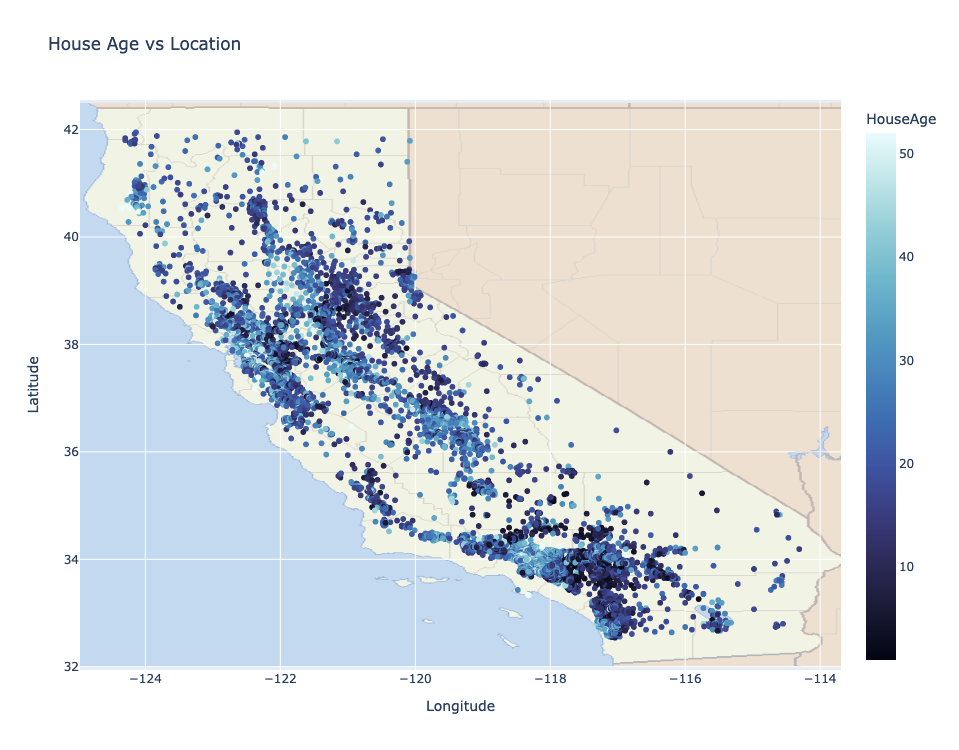

In [20]:
fig1 = px.scatter(df, x="Longitude", y="Latitude", color="HouseAge", 
           width=600, height=750, title="House Age vs Location", color_continuous_scale='ice')
fig1.add_layout_image(
        dict(
            source=pyLogo,
            xref="x",
            yref="y",
            x=-125,
            y=42.5,
            sizex=11.5,
            sizey=10.5,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)

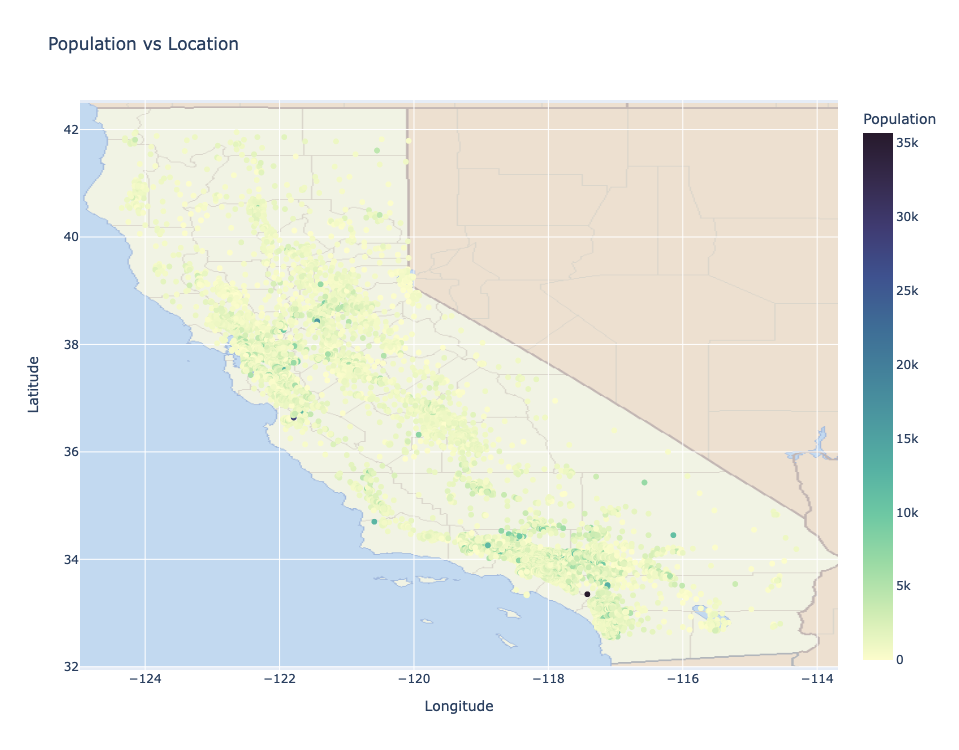

In [22]:
fig2 = px.scatter(df, x="Longitude", y="Latitude", color="Population", 
           width=600, height=750, title="Population vs Location", color_continuous_scale='deep')
fig2.add_layout_image(
        dict(
            source=pyLogo,
            xref="x",
            yref="y",
            x=-125,
            y=42.5,
            sizex=11.5,
            sizey=10.5,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)

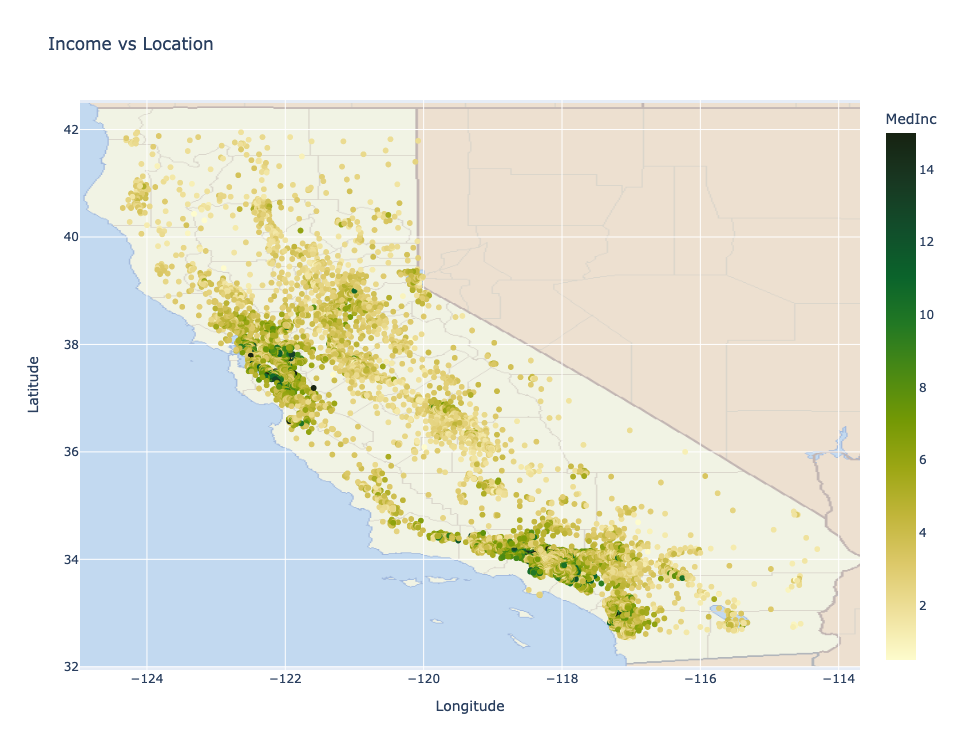

In [136]:
fig = px.scatter(df, x="Longitude", y="Latitude", color="MedInc",
           width=600, height=750, title="Income vs Location", color_continuous_scale='speed')
fig.add_layout_image(
        dict(
            source=pyLogo,
            xref="x",
            yref="y",
            x=-125,
            y=42.5,
            sizex=11.5,
            sizey=10.5,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)

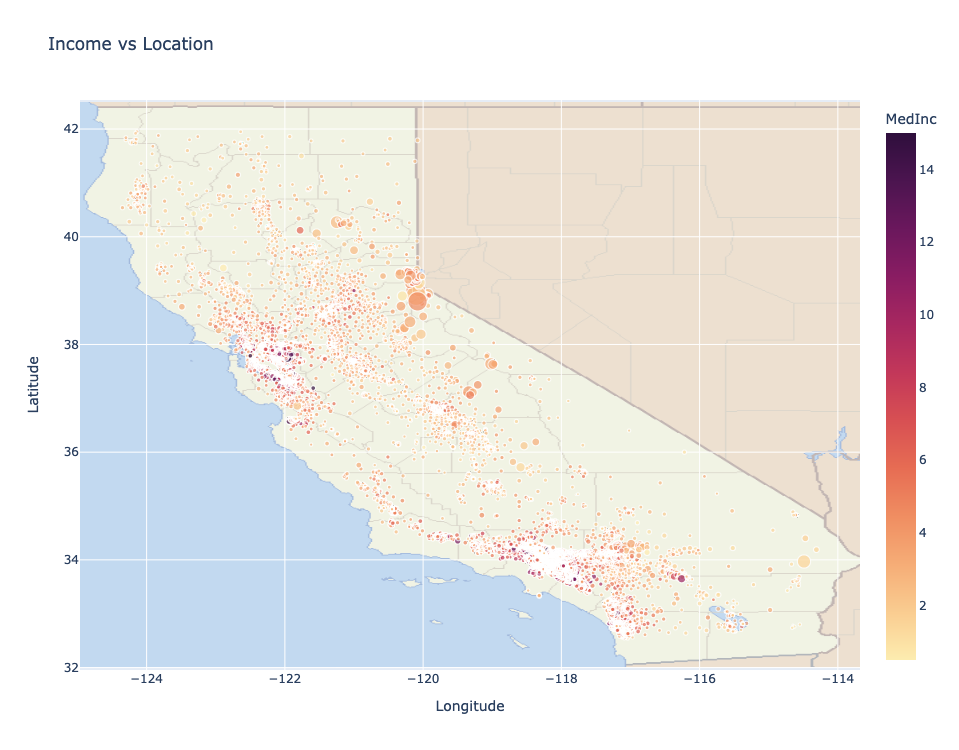

In [139]:
fig = px.scatter(df, x="Longitude", y="Latitude", color="MedInc", size="AveRooms",hover_data=['Town'],
           width=600, height=750, title="Income vs Location", color_continuous_scale='matter')
fig.add_layout_image(
        dict(
            source=pyLogo,
            xref="x",
            yref="y",
            x=-125,
            y=42.5,
            sizex=11.5,
            sizey=10.5,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)

## Median House Value in North CA

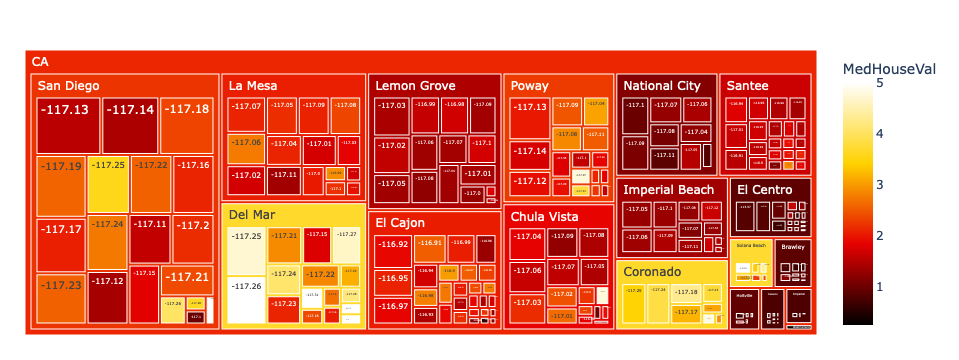

In [146]:
fig = px.treemap(df[df.Latitude < 33], path=[px.Constant('CA'),'Town','Longitude'], values='MedInc',
                 color='MedHouseVal', color_continuous_scale='hot')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
# fig.show()

In [140]:
app = dp.App.from_notebook()

Notebook converted to blocks.

In [141]:
app.save("ca_housing_eda.html")

App saved to ./ca_housing_eda.html

In [112]:
app.upload("CA Housing EDA")

Uploading app and associated data - *please wait...*

App successfully uploaded. View and share your app at <a href='https://cloud.datapane.com/apps/dA6R22A/ca-housing-eda/' target='_blank'>here</a>.